## Finding the dataset

Let's find the dataset in this link: https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection

## Import packages

In [6]:
pip install opencv-python

In [1]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import glob
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score
import random
import sys
import cv2

## Reading the Images

In [2]:
tumor = []
healthy = []
for f in glob.iglob('F:/Data_Analytics/Datasets/yes/*jpg'):
    img = cv2.imread(f)
    img = cv2.resize (img, (128, 128))
    b, g, r = cv2.split(img)
    img = cv2.merge([r, g, b])
    tumor.append(img)

for f in glob.iglob('F:/Data_Analytics/Datasets/no/*jpg'):
    img = cv2.imread(f)
    img = cv2.resize (img, (128, 128))
    b, g, r = cv2.split(img)
    img = cv2.merge([r, g, b])
    healthy.append(img)

In [20]:
#for img in tumor:
    #print (img.shape)

In [3]:
healthy = np.array(healthy)
tumor = np.array(tumor)

In [4]:
tumor.shape
healthy.shape
All = np.concatenate ((healthy, tumor))
All.shape

(245, 128, 128, 3)

In [5]:
healthy.shape

(91, 128, 128, 3)

In [6]:
np.random.choice(10, 5, replace = False)

array([1, 3, 9, 6, 0])

## Visualizing Brain MRI images

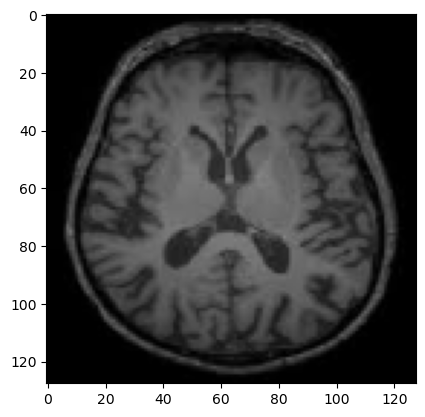

In [7]:
plt.imshow(healthy[0])

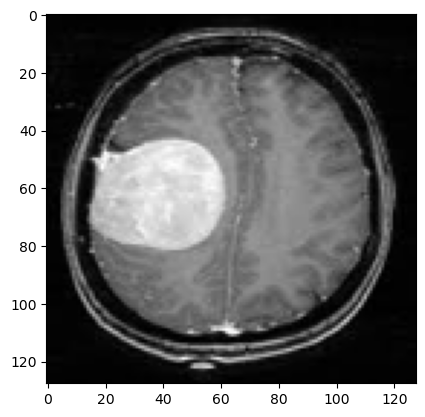

In [8]:
plt.imshow(tumor[0])

In [9]:
def plot_random(healthy, tumor, num = 5):
    healthy_imgs = healthy [np.random.choice(healthy.shape[0], num, replace = False)]
    tumor_imgs = tumor[np.random.choice(tumor.shape[0], num, replace = False)]
    
    plt.figure (figsize = (16,9))
    for i in range (num):
        plt.subplot(1, num, i+1)
        plt.title('healthy')
        plt.imshow(healthy_imgs[i])
    
    plt.figure (figsize = (16,9))
    for i in range (num):
        plt.subplot(1, num, i+1)
        plt.title('tumor')
        plt.imshow(tumor_imgs[i])

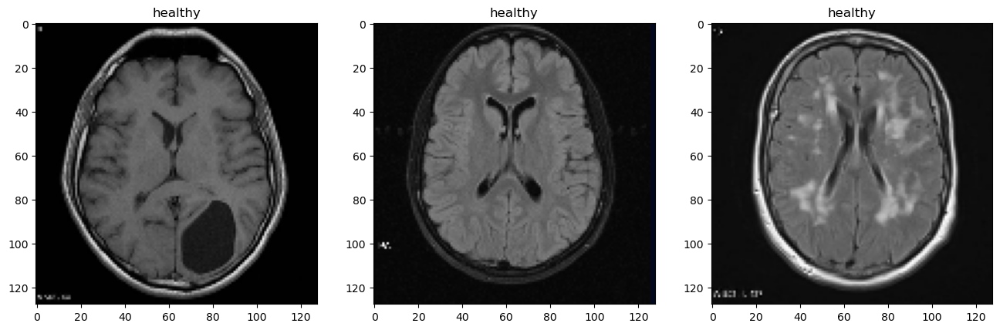

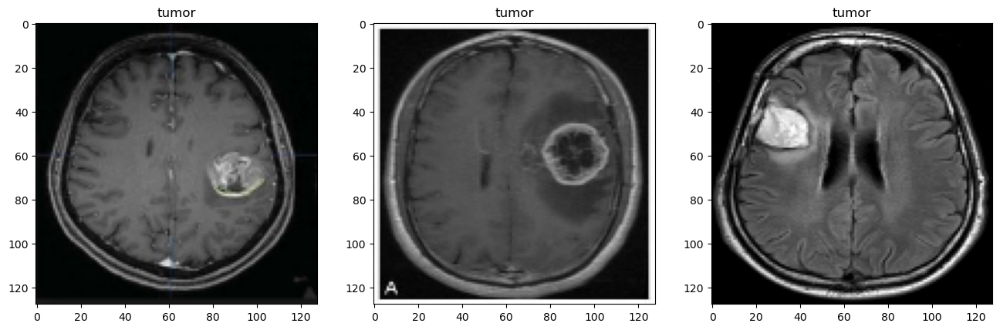

In [10]:
plot_random(healthy, tumor, num = 3)

## Create Pytorch Dataset class

In [1]:
class Dataset (object):
    
    def __getitem__(self, index):
        raise NotImplemetedError
    def __len__(self):
        raise NotImplementedError
    def __add__(self, other):
        return ConcatDataset([self, other])

## Creating MRI custom dataset class

In [11]:
class MRI (Dataset):
    def __init__(self):
        
        tumor = []
        healthy = []
        #cv2 -it reads in BGR format by default
        for f in glob.iglob('F:/Data_Analytics/Datasets/yes/*jpg'):
            img = cv2.imread(f)
            img = cv2.resize (img, (128, 128))
            b, g, r = cv2.split(img)
            img = cv2.merge([r, g, b])
            img = img.reshape((img.shape[2], img.shape[0], img.shape[1]))
            tumor.append(img)
        
        for f in glob.iglob('F:/Data_Analytics/Datasets/no/*jpg'):
            img = cv2.imread(f)
            img = cv2.resize (img, (128, 128))
            b, g, r = cv2.split(img)
            img = cv2.merge([r, g, b])
            img = img.reshape((img.shape[2], img.shape[0], img.shape[1]))
            healthy.append(img)
        
        # our images
        tumor = np.array (tumor, dtype =np.float32)
        healthy = np.array(healthy, dtype = np.float32)
        
        #our label
        tumor_label = np.ones (tumor.shape[0], dtype =np.float32)
        healthy_label = np.zeros (healthy.shape[0], dtype = np.float32)
        
        # concatenates
        self.images = np.concatenate ((tumor, healthy), axis=0)
        self.labels = np.concatenate ((tumor_label, healthy_label))
        
    def __len__(self):
        return self.images.shape[0]
    def __getitem__(self, index):
        sample = {'image': self.images[index], 'label': self.labels[index]}
        return sample 
    def normalize (self):
        self.images = self.images/255.0

In [12]:
mri = MRI()

In [13]:
mri.normalize()

In [14]:
img = mri[5]['image']

In [15]:
img.shape

(3, 128, 128)

In [16]:
np.max(img)

1.0

## Creating dataloader

In [17]:
index = list(range(len(mri)))
random.shuffle(index)
for idx in index:
    sample = mri[idx]
    print(sample)
    sys.exit()

{'image': array([[[0.05490196, 0.05490196, 0.05490196, ..., 0.06666667,
         0.08627451, 0.08627451],
        [0.08627451, 0.07450981, 0.07450981, ..., 0.67058825,
         0.67058825, 0.77254903],
        [0.77254903, 0.77254903, 0.827451  , ..., 0.34117648,
         0.34117648, 0.34117648],
        ...,
        [0.5686275 , 0.5686275 , 0.5529412 , ..., 0.07843138,
         0.07843138, 0.07843138],
        [0.0627451 , 0.0627451 , 0.0627451 , ..., 0.9372549 ,
         0.8901961 , 0.8901961 ],
        [0.8901961 , 0.8352941 , 0.8352941 , ..., 0.61960787,
         0.61960787, 0.5803922 ]],

       [[0.5803922 , 0.5803922 , 0.56078434, ..., 0.07450981,
         0.07450981, 0.07450981],
        [0.0627451 , 0.0627451 , 0.0627451 , ..., 0.8745098 ,
         0.78039217, 0.78039217],
        [0.78039217, 0.6745098 , 0.6745098 , ..., 0.60784316,
         0.60784316, 0.5803922 ],
        ...,
        [0.5529412 , 0.5764706 , 0.5764706 , ..., 0.52156866,
         0.52156866, 0.5176471 ],
  

SystemExit: 

F:\Data_Analytics\New folder\lib\site-packages\IPython\core\interactiveshell.py:3468: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


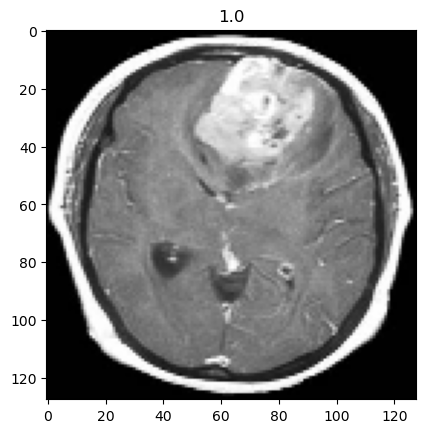

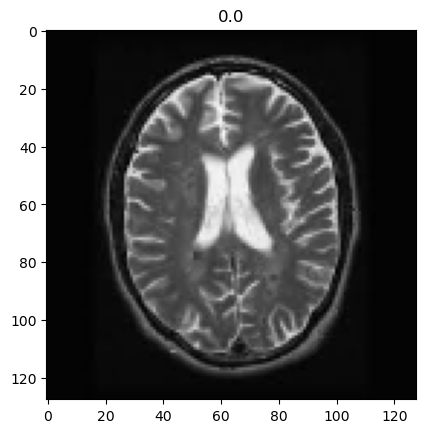

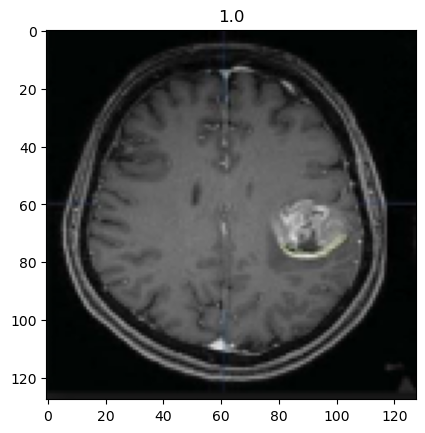

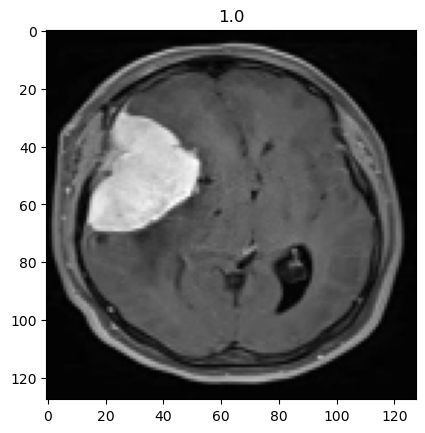

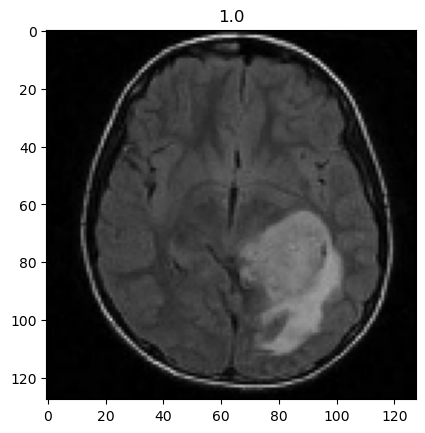

...

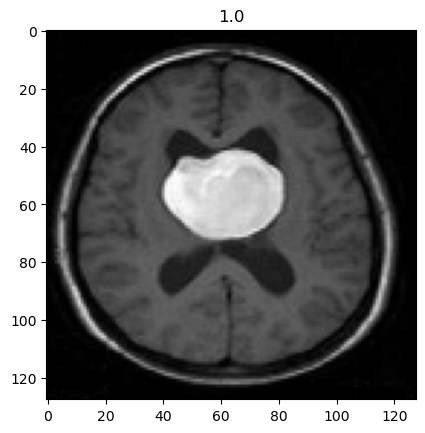

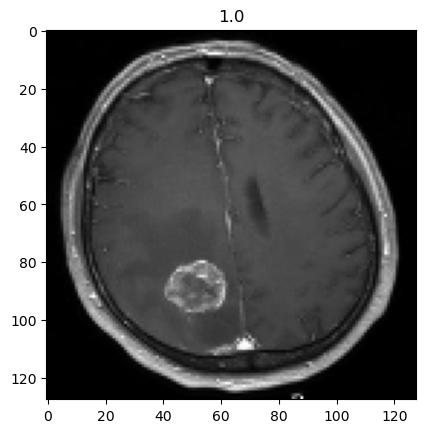

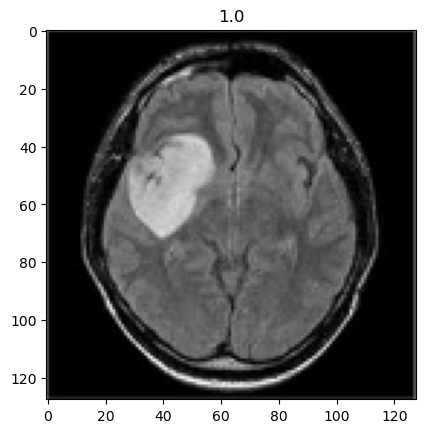

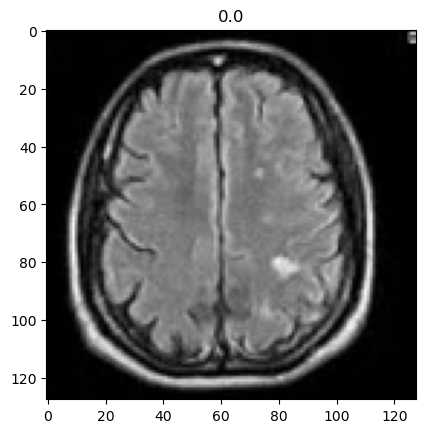

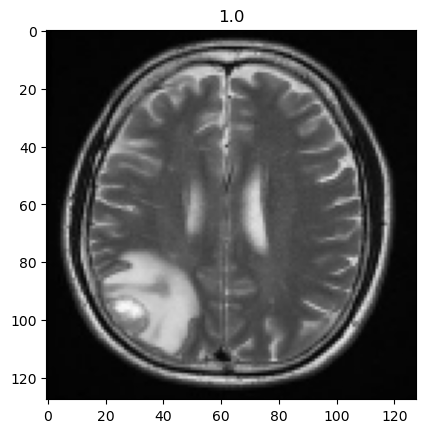

KeyboardInterrupt: 

In [18]:
index = list(range(len(mri)))
random.shuffle(index)
for idx in index:
    sample = mri[idx]
    img = sample['image']
    label = sample['label']
    img = img.reshape(img.shape[1], img.shape[2], img.shape[0])
    plt.title(label)
    plt.imshow(img)
    plt.show()

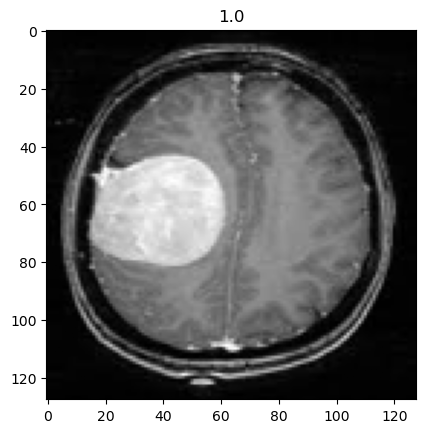

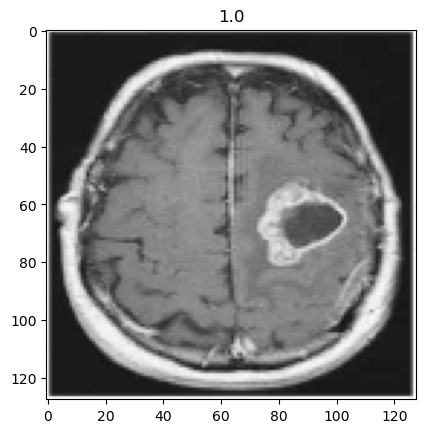

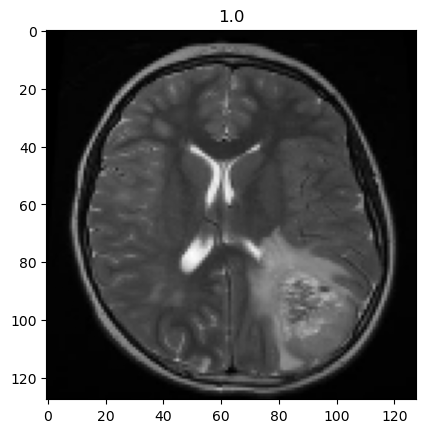

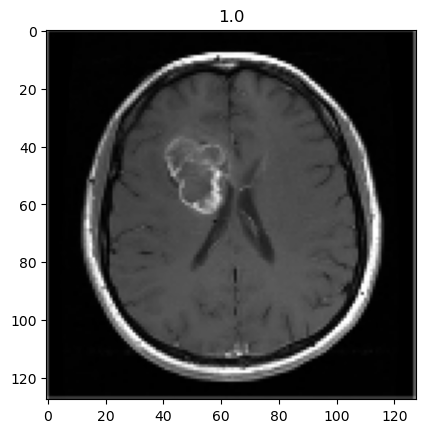

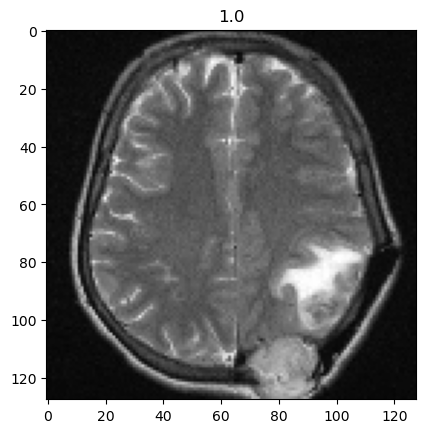

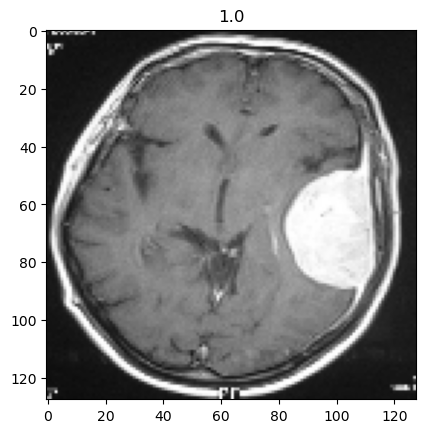

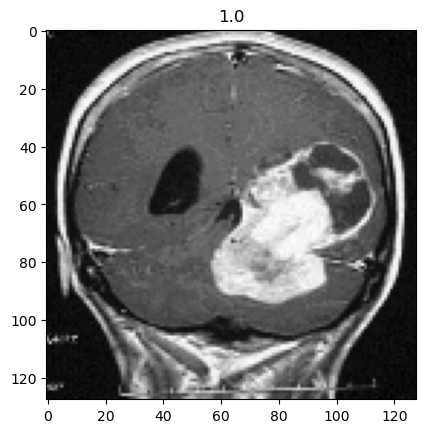

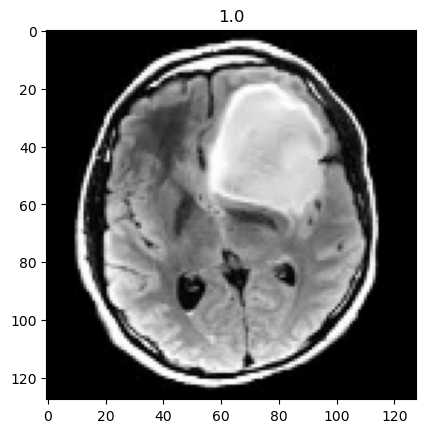

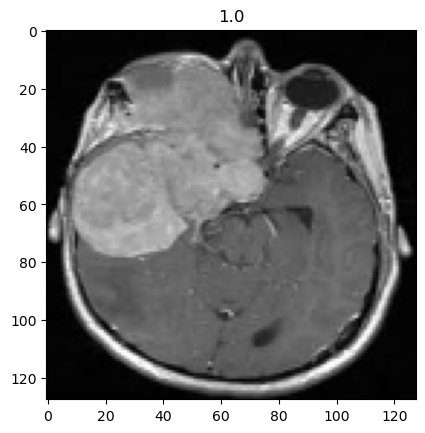

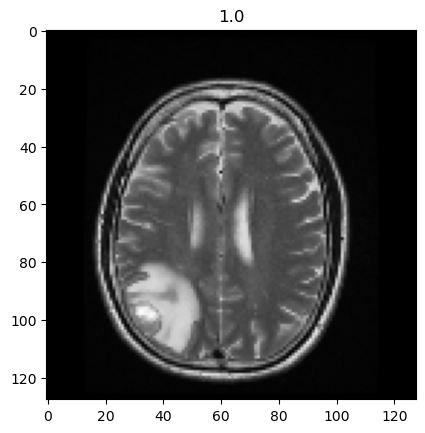

In [32]:
it = iter(mri)
for i in range(10):
    sample = next(it)
    img = sample['image']
    label = sample['label']
    img = img.reshape(img.shape[1], img.shape[2], img.shape[0])
    plt.title(label)
    plt.imshow(img)
    plt.show()

In [33]:
dataloader = DataLoader (mri)

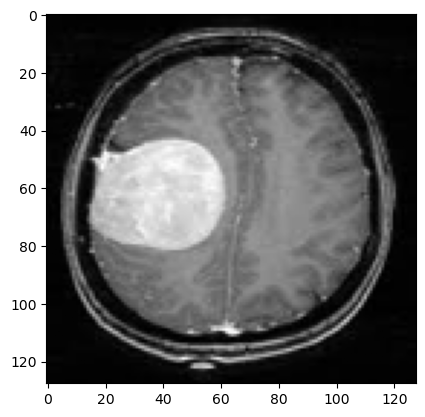

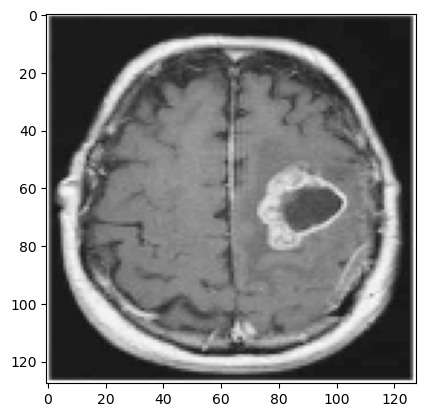

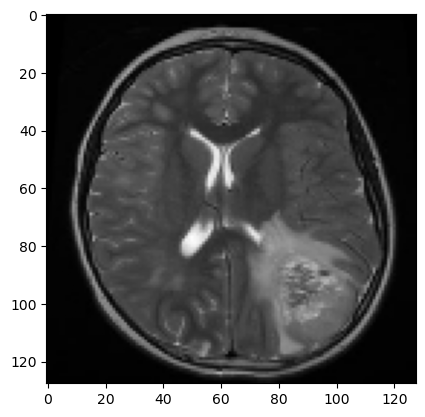

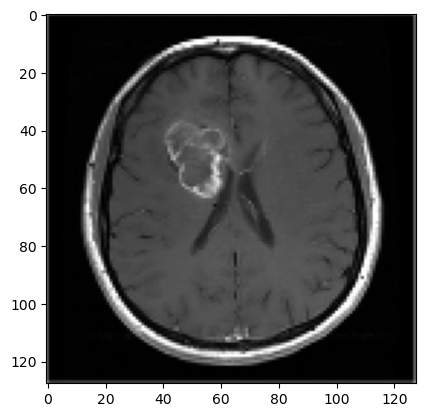

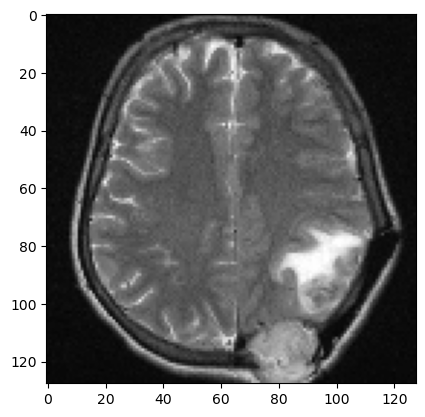

...

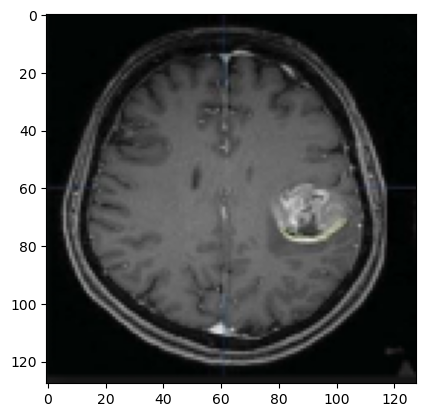

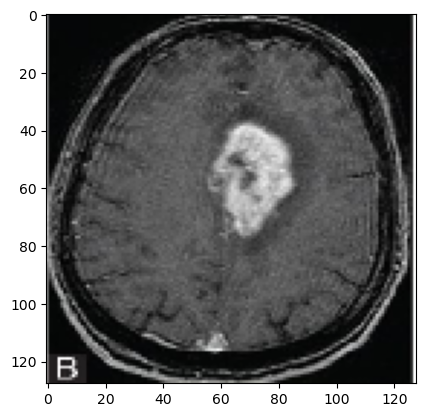

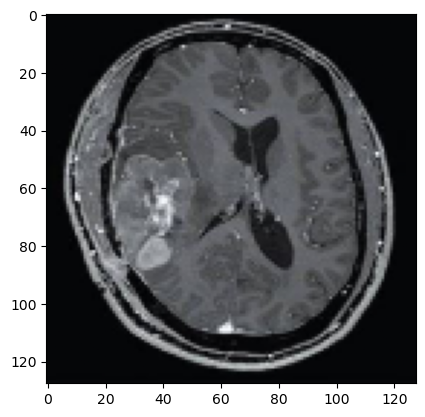

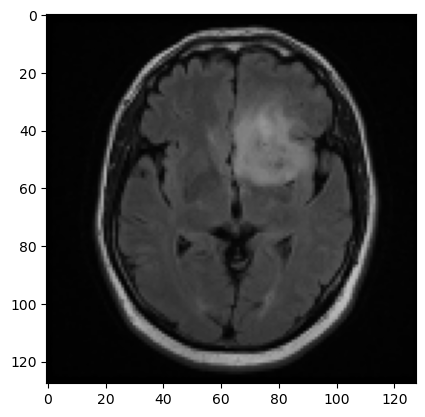

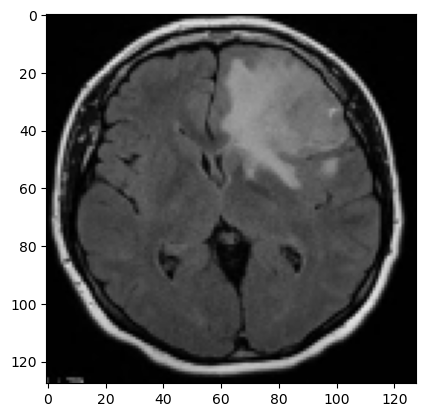

KeyboardInterrupt: 

In [34]:
for sample in dataloader:
    img = sample['image'].squeeze()
    img = img.reshape(img.shape[1], img.shape[2], img.shape[0])
    plt.imshow(img)
    plt.show()

In [19]:
dataloader = DataLoader (mri, batch_size = 10, shuffle = True)

In [20]:
for sample in dataloader:
    img = sample['image']
    print(img.shape)
    sys.exit()
    
# img = img.reshape(img.shape[1], img.shape[2], img.shape[0])
# plt.imshow(img)
# plt.show()


torch.Size([10, 3, 128, 128])


SystemExit: 

## Create a model

In [21]:
import torch.nn as nn
import torch.nn.functional as F

class CNN (nn.Module):
    def __init__(self):
        super (CNN, self).__init__()
        self.cnn_model = nn.Sequential(
        nn.Conv2d(in_channels = 3, out_channels =6, kernel_size = 5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size =2, stride = 5),
        nn.Conv2d(in_channels = 6, out_channels =16, kernel_size = 5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size =2, stride = 5))
        
        
        self.fc_model = nn.Sequential (
        nn.Linear(in_features= 256, out_features = 120),
        nn.Tanh(),
        nn.Linear(in_features= 120, out_features = 84),
        nn.Tanh(),
        nn.Linear(in_features= 84, out_features = 1))        
        
    def forward(self, x):
        x = self.cnn_model(x)
        x = x.view(x.size(0), -1)
        x = self.fc_model(x)
        x = F.sigmoid(x)
        
        return x
        

In [22]:
model = CNN()

In [23]:
model

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [24]:
model.cnn_model

Sequential(
  (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (1): Tanh()
  (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
  (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (4): Tanh()
  (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
)

In [25]:
model.cnn_model[0]

Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))

In [26]:
model.cnn_model[0].weight

Parameter containing:
tensor([[[[ 0.0137, -0.0910, -0.0910, -0.1099, -0.0479],
          [ 0.0456, -0.0964, -0.0918,  0.0668,  0.0676],
          [-0.0485,  0.0105,  0.0509, -0.0221, -0.0229],
          [ 0.0814,  0.0617, -0.0752,  0.0273,  0.0661],
          [-0.0716,  0.0656,  0.0374, -0.0667,  0.0663]],

         [[-0.0252, -0.0831,  0.1140,  0.0078,  0.0079],
          [-0.0541, -0.0039, -0.0225,  0.0909,  0.1057],
          [ 0.0448,  0.0805,  0.0372,  0.0457, -0.0050],
          [-0.1116,  0.0663, -0.0223,  0.0022,  0.0317],
          [ 0.0226,  0.0379,  0.0265, -0.0728,  0.0905]],

         [[ 0.0278,  0.0470,  0.0561, -0.0710, -0.0953],
          [-0.0220, -0.0566,  0.0459,  0.0270,  0.0588],
          [ 0.1096, -0.0478,  0.0888,  0.0525,  0.0319],
          [-0.0058, -0.0092,  0.0012,  0.0903, -0.0815],
          [ 0.0854,  0.0033,  0.0253, -0.0260,  0.0507]]],


        [[[ 0.0607,  0.0250, -0.0246, -0.0403,  0.0226],
          [ 0.0643, -0.0398,  0.0042,  0.0782, -0.0593],
 

In [43]:
model.cnn_model[0].weight.shape

torch.Size([6, 3, 5, 5])

In [44]:
model.cnn_model[0].weight[0]

tensor([[[-0.0123, -0.0653, -0.0458,  0.0108,  0.0045],
         [ 0.0753,  0.0366, -0.0826,  0.0444,  0.1057],
         [-0.0114,  0.0924,  0.0777,  0.0491, -0.0620],
         [-0.0145, -0.0252,  0.0104,  0.0961, -0.1128],
         [-0.0230, -0.1125, -0.0299, -0.1079, -0.1096]],

        [[ 0.0672, -0.0365, -0.0951, -0.0056, -0.0328],
         [-0.0718, -0.0345, -0.1079,  0.0371,  0.0210],
         [ 0.0359,  0.0463, -0.0891,  0.0570, -0.0089],
         [-0.0085,  0.1127,  0.0945, -0.0319, -0.0265],
         [ 0.0952,  0.1089,  0.0558,  0.0009,  0.0577]],

        [[ 0.0229,  0.1042,  0.0263, -0.0627, -0.1018],
         [-0.0708, -0.0195,  0.0658, -0.1153, -0.0614],
         [-0.0228, -0.1097, -0.0404, -0.1011,  0.0667],
         [-0.1013,  0.0670, -0.0856, -0.0645,  0.0796],
         [ 0.0960,  0.0396,  0.0784,  0.0883, -0.0165]]],
       grad_fn=<SelectBackward0>)

In [27]:
model.cnn_model[0].weight[0].shape

torch.Size([3, 5, 5])

In [28]:
model.cnn_model[0].weight[0][1]

tensor([[-0.0252, -0.0831,  0.1140,  0.0078,  0.0079],
        [-0.0541, -0.0039, -0.0225,  0.0909,  0.1057],
        [ 0.0448,  0.0805,  0.0372,  0.0457, -0.0050],
        [-0.1116,  0.0663, -0.0223,  0.0022,  0.0317],
        [ 0.0226,  0.0379,  0.0265, -0.0728,  0.0905]],
       grad_fn=<SelectBackward0>)

## Linear layer

In [29]:
model.fc_model

Sequential(
  (0): Linear(in_features=256, out_features=120, bias=True)
  (1): Tanh()
  (2): Linear(in_features=120, out_features=84, bias=True)
  (3): Tanh()
  (4): Linear(in_features=84, out_features=1, bias=True)
)

In [30]:
model.fc_model[0].weight.shape

torch.Size([120, 256])

## Understanding x.view

In [31]:
x = torch.tensor([1, 2, 3,4,5,6,7,8,9,10,11,12,13,14,15,16])

In [32]:
x = x.reshape((2,2,2,2))

In [33]:
x

tensor([[[[ 1,  2],
          [ 3,  4]],

         [[ 5,  6],
          [ 7,  8]]],


        [[[ 9, 10],
          [11, 12]],

         [[13, 14],
          [15, 16]]]])

In [34]:
x.size(0)

2

In [35]:
x.view(-1)

tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])

In [36]:
x.view(x.size(0), -1)

tensor([[ 1,  2,  3,  4,  5,  6,  7,  8],
        [ 9, 10, 11, 12, 13, 14, 15, 16]])

In [37]:
x.view(x.size(0), -1).shape

torch.Size([2, 8])

## Evaluate a new-Born Neutral network

In [90]:
mri_dataset = MRI()
mri_dataset.normalize()
device = torch.device ('cpu')
model = CNN().to(device)

In [91]:
dataloader = DataLoader (mri_dataset, batch_size = 32, shuffle = False)

In [92]:
model.eval()
outputs = []
y_true = []

with torch.no_grad():
    for D in dataloader:
        image = D['image'].to (device)
        label = D['label'].to (device)
        y_hat = model(image)
        outputs.append(y_hat.detach().numpy())
        y_true.append(label.detach().numpy())
    
    

F:\Data_Analytics\New folder\lib\site-packages\torch\nn\functional.py:1960: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


In [93]:
outputs = np.concatenate(outputs, axis =0).squeeze()

In [94]:
y_true = np.concatenate(y_true, axis =0).squeeze()

In [95]:
def threshold(scores, threshold = 0.50, minimum = 0, maximum = 1.0 ):
    x = np.array(list(scores))
    x[x >= threshold] = maximum
    x[x <= threshold] = minimum
    return x
    

In [96]:
accuracy_score(y_true, threshold(outputs))

0.6285714285714286

[Text(0, 0.5, 'Tumor'), Text(0, 1.5, 'Healthy')]

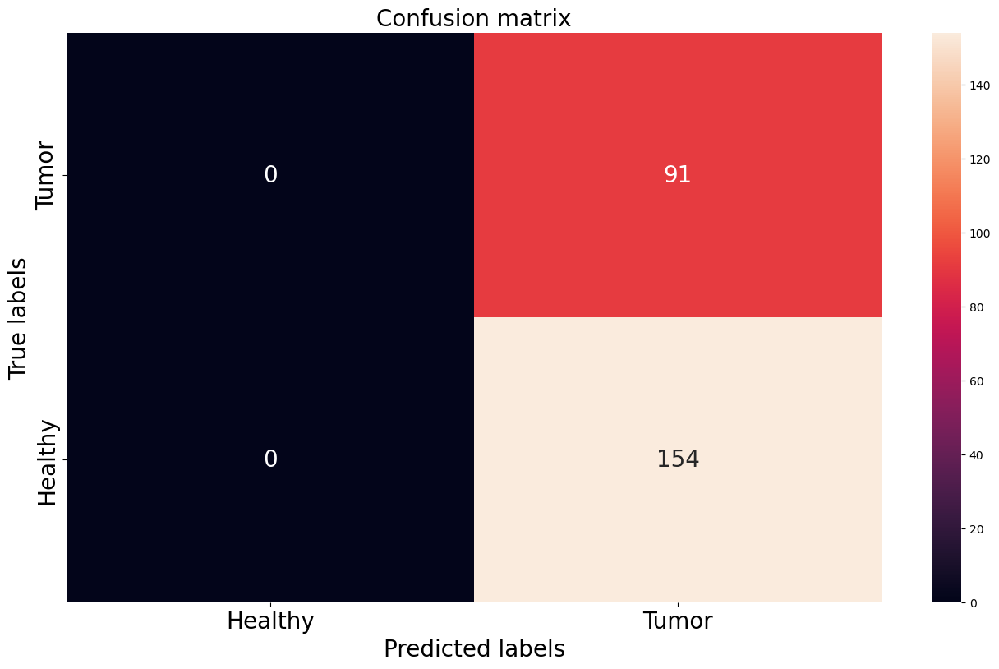

In [97]:
import seaborn as sns
plt.figure(figsize =(16,9))
cm = confusion_matrix(y_true, threshold(outputs))
ax = plt.subplot()
sns.heatmap(cm, annot = True, fmt = 'g', ax = ax, annot_kws = {"size": 20})

ax.set_xlabel ('Predicted labels', fontsize =20)
ax.set_ylabel ('True labels', fontsize =20)
ax.set_title ('Confusion matrix', fontsize = 20)
ax.xaxis.set_ticklabels(['Healthy', 'Tumor'], fontsize=20)
ax.yaxis.set_ticklabels(['Tumor', 'Healthy'], fontsize =20)

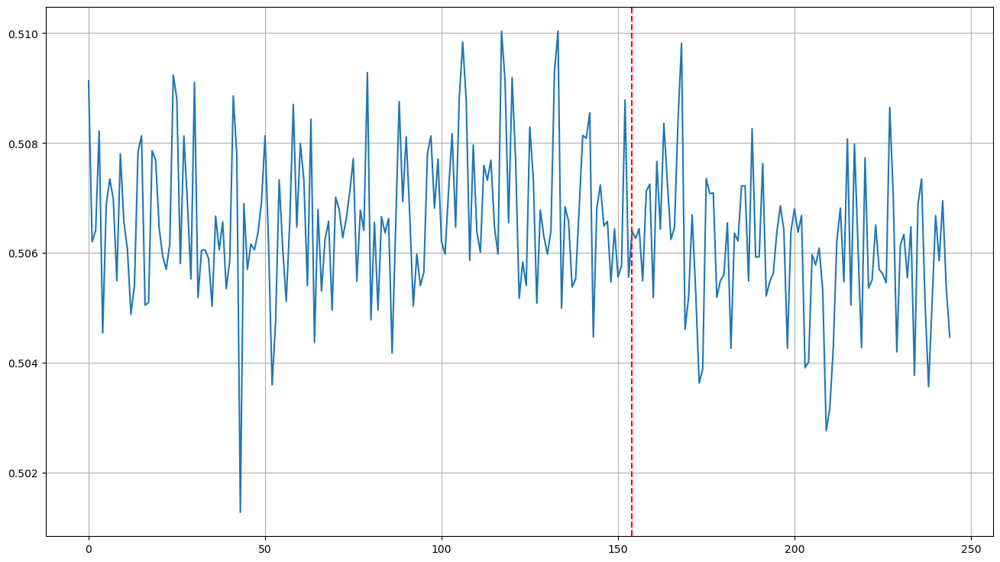

In [98]:
plt.figure(figsize =(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color ='r', linestyle = '--')
plt.grid()

## Train the dumb model

In [99]:
eta = 0.0001
EPOCH = 500
optimizer = torch.optim.Adam(model.parameters(), lr = eta)
dataloader = DataLoader (mri_dataset, batch_size = 32, shuffle = False)
model.train()

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [100]:
for epoch in range (1, EPOCH):
    losses = []
    for D in dataloader:
        optimizer.zero_grad()
        data = D['image'].to(device)
        label = D['label'].to(device)
        y_hat = model(data)
        
        # define loss function
        error = nn.BCELoss()
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    if(epoch+1) % 10 == 0:
        print('Train Epoch: {}\tLoss: {:.6f}'.format(epoch+1, np.mean(losses)))
        

F:\Data_Analytics\New folder\lib\site-packages\torch\nn\functional.py:1960: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Train Epoch: 10	Loss: 0.663082
Train Epoch: 20	Loss: 0.653213
Train Epoch: 30	Loss: 0.649900
Train Epoch: 40	Loss: 0.646917
Train Epoch: 50	Loss: 0.643610
Train Epoch: 60	Loss: 0.639722
Train Epoch: 70	Loss: 0.634971
Train Epoch: 80	Loss: 0.628975
Train Epoch: 90	Loss: 0.621224
Train Epoch: 100	Loss: 0.611104
Train Epoch: 110	Loss: 0.598007
Train Epoch: 120	Loss: 0.581644
Train Epoch: 130	Loss: 0.562505
Train Epoch: 140	Loss: 0.542097
Train Epoch: 150	Loss: 0.522543
Train Epoch: 160	Loss: 0.505601
Train Epoch: 170	Loss: 0.491879
Train Epoch: 180	Loss: 0.480947
Train Epoch: 190	Loss: 0.471953
Train Epoch: 200	Loss: 0.464092
Train Epoch: 210	Loss: 0.456774
Train Epoch: 220	Loss: 0.449606
Train Epoch: 230	Loss: 0.442336
Train Epoch: 240	Loss: 0.434799
Train Epoch: 250	Loss: 0.426885
Train Epoch: 260	Loss: 0.418523
Train Epoch: 270	Loss: 0.409678
Train Epoch: 280	Loss: 0.400346
Train Epoch: 290	Loss: 0.390554
Train Epoch: 300	Loss: 0.380361
Train Epoch: 310	Loss: 0.369851
Train Epoch: 320	

## Evaluate a smart model

In [101]:
model.eval()
dataloader = DataLoader (mri_dataset, batch_size = 32, shuffle = False)
outputs = []
y_true = []

with torch.no_grad():
    for D in dataloader:
        image = D['image'].to (device)
        label = D['label'].to (device)
        
        y_hat = model(image)
        
        outputs.append(y_hat.detach().numpy())
        y_true.append(label.detach().numpy())


outputs = np.concatenate(outputs, axis =0)
y_true = np.concatenate(y_true, axis =0)

In [102]:
accuracy_score(y_true, threshold(outputs))

0.926530612244898

[Text(0, 0.5, 'Tumor'), Text(0, 1.5, 'Healthy')]

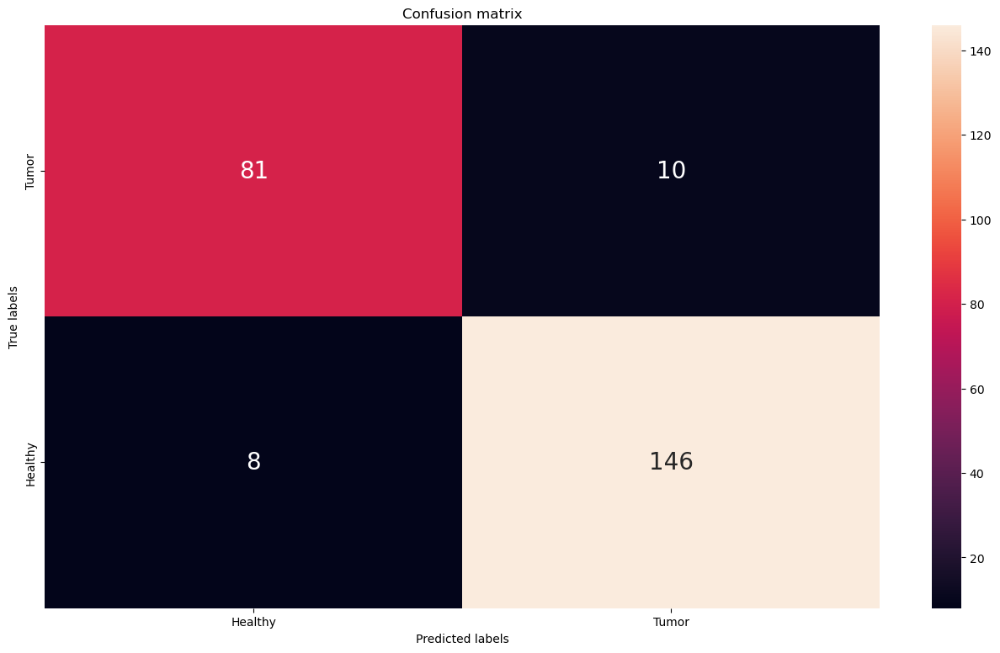

In [103]:
cm = confusion_matrix(y_true, threshold(outputs))
plt.figure(figsize =(16,9))

ax = plt.subplot()
sns.heatmap(cm, annot = True, fmt = 'g', ax = ax, annot_kws = {"size": 20})

ax.set_xlabel ('Predicted labels');ax.set_ylabel ('True labels');
ax.set_title ('Confusion matrix');
ax.xaxis.set_ticklabels(['Healthy', 'Tumor'])
ax.yaxis.set_ticklabels(['Tumor', 'Healthy'])

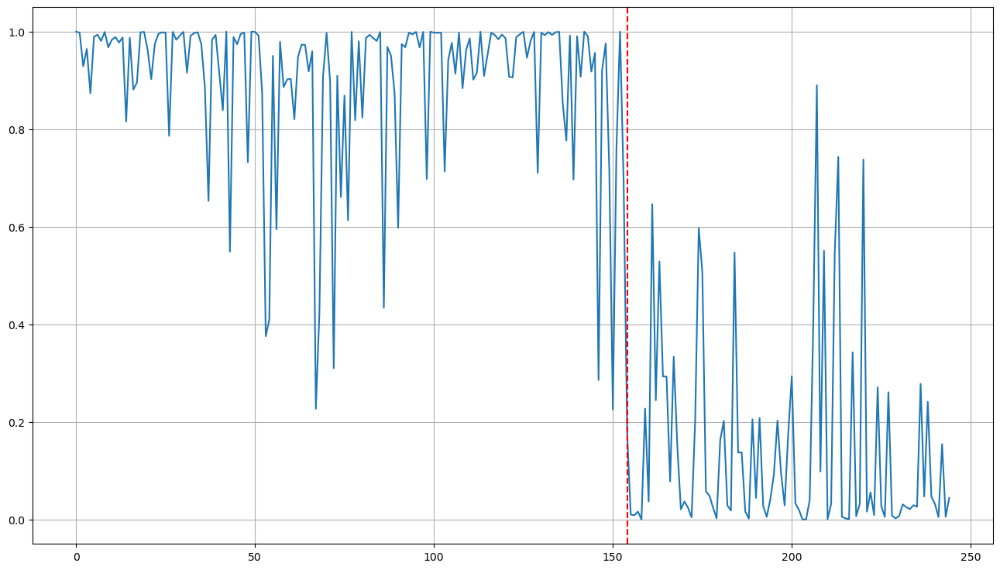

In [104]:
plt.figure(figsize =(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color ='r', linestyle = '--')
plt.grid()

## Visualization the feature maps of the convolutional fiters

In [105]:
model

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [106]:
no_of_layers = 0
conv_layers = []

In [107]:
model_children = list(model.children())
model_children

[Sequential(
   (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
   (1): Tanh()
   (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
   (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
   (4): Tanh()
   (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
 ),
 Sequential(
   (0): Linear(in_features=256, out_features=120, bias=True)
   (1): Tanh()
   (2): Linear(in_features=120, out_features=84, bias=True)
   (3): Tanh()
   (4): Linear(in_features=84, out_features=1, bias=True)
 )]

In [108]:
for child in model_children:
    if type(child) == nn.Sequential:
        for layer in child.children():
            if type(layer) == nn.Conv2d:
                no_of_layers += 1
                conv_layers.append(layer)
            

In [109]:
conv_layers[1]

Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))

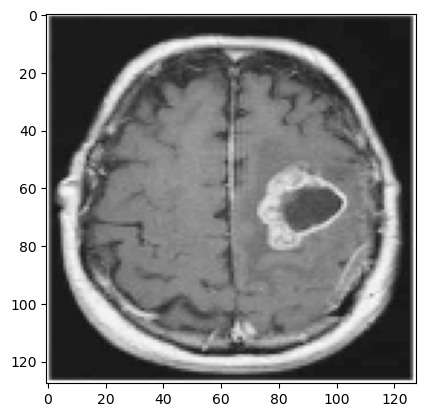

In [110]:
img = mri_dataset[100]['image']
plt.imshow(img.reshape(128,128,3))

In [111]:
img = torch.from_numpy(img).to(device)

In [112]:
img.shape

torch.Size([3, 128, 128])

In [113]:
img = img.unsqueeze(0)
img.shape

torch.Size([1, 3, 128, 128])

In [114]:
results = [conv_layers[0](img)]
for i in range(1, len(conv_layers)):
    results.append(conv_layers[i](results[-1]))
outputs = results

In [115]:
len(outputs)

2

In [116]:
outputs[0].shape

torch.Size([1, 6, 124, 124])

Layer 1


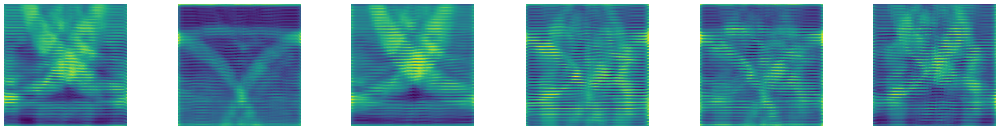

Layer 2


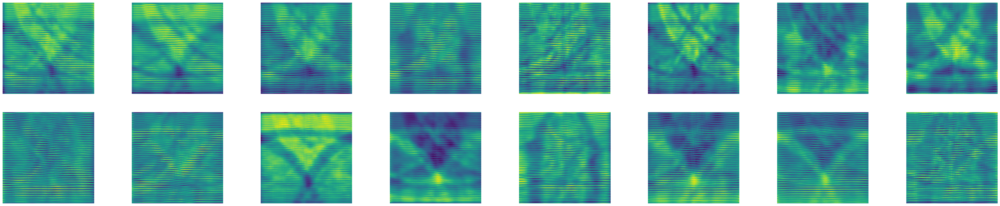

In [117]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(50,10))
    layer_viz = outputs[num_layer].squeeze()
    print('Layer', num_layer+1)
    for i, f in enumerate(layer_viz):
        plt.subplot(2, 8, i+1)
        plt.imshow(f.detach().numpy())
        plt.axis('off')
    plt.show()
    plt.close()

In [118]:
from sklearn.model_selection import train_test_split

In [186]:
class MRI (Dataset):
    def __init__(self):
        # variables to hold the training data and validation data
        self.X_train, self.y_train, self.X_val, self.y_val = None, None, None, None
        
        # variable to determine if we are interested in retrieving the training or the validation data
        self.mode = 'train'
        
        tumor = []
        healthy = []
        #cv2 -it reads in BGR format by default
        for f in glob.iglob('F:/Data_Analytics/Datasets/yes/*jpg'):
            img = cv2.imread(f)
            img = cv2.resize (img, (128, 128))
            b, g, r = cv2.split(img)
            img = cv2.merge([r, g, b])
            img = img.reshape((img.shape[2], img.shape[0], img.shape[1]))
            tumor.append(img)
        
        for f in glob.iglob('F:/Data_Analytics/Datasets/no/*jpg'):
            img = cv2.imread(f)
            img = cv2.resize (img, (128, 128))
            b, g, r = cv2.split(img)
            img = cv2.merge([r, g, b])
            img = img.reshape((img.shape[2], img.shape[0], img.shape[1]))
            healthy.append(img)
        
        # our images
        tumor = np.array (tumor, dtype =np.float32)
        healthy = np.array(healthy, dtype = np.float32)
        
        #our label
        tumor_label = np.ones (tumor.shape[0], dtype =np.float32)
        healthy_label = np.zeros (healthy.shape[0], dtype = np.float32)
        
        # concatenates
        self.images = np.concatenate ((tumor, healthy), axis=0)
        self.labels = np.concatenate ((tumor_label, healthy_label))
        
    # Define a function that would separte the data into training and validation sets
    def train_val_split(self):
        self.X_train, self.X_val, self.y_train, self.y_val = \
        train_test_split(self.images, self.labels, test_size = 0.20, random_state = 42)
    
    def __len__(self):
        # use self.mode to determine whether train or val data is of interest
        if self.mode == 'train':
            return self.X_train.shape[0]
        elif self.mode == 'val':
            return self.X_val.shape[0]
        
    def __getitem__(self, index):
        # use self.mode to determine whether train or val data is of interest
        if self.mode =='train':
            if index < len(self.X_train):  # Check if index is within bounds
                sample = {'image': self.X_train[index], 'label': self.y_train[index]}
                return sample
            else:
                print("Index out of bounds for training data.")
                return None
            sample = {'image': self.X_train[idx], 'label': self.y_train[idx]}
        
        elif self.mode == 'val':
            if index < len(self.X_val):
                sample = {'image': self.X_val[index], 'label': self.y_val[index]}
                return sample
            
            else:
                print("Index out of bounds for validation data.")
                return None 
            
    def normalize (self):
        self.images = self.images/255.0

## Detecting Overfitting

In [187]:
mri_dataset = MRI()

In [188]:
mri_dataset.normalize()

In [173]:
mri_dataset.train_val_split()

In [174]:
# Check the sizes of X_train and y_train
print(len(mri_dataset.X_train))  
print(len(mri_dataset.y_train))

196
196


In [175]:
# Check the indices and their values
print(mri_dataset.X_train[0])  
print(mri_dataset.y_train[0])

[[[0.0627451  0.0627451  0.0627451  ... 0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667 ... 0.06666667 0.06666667 0.0627451 ]
  [0.0627451  0.0627451  0.06666667 ... 0.05882353 0.05882353 0.05882353]
  ...
  [0.4627451  0.4627451  0.42352942 ... 0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451  ... 0.38431373 0.4392157  0.4392157 ]
  [0.4392157  0.39607844 0.39607844 ... 0.46666667 0.46666667 0.45882353]]

 [[0.45882353 0.45882353 0.47058824 ... 0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451  ... 0.3254902  0.40392157 0.40392157]
  [0.40392157 0.40392157 0.40392157 ... 0.3764706  0.3764706  0.41568628]
  ...
  [0.4117647  0.3882353  0.3882353  ... 0.38431373 0.38431373 0.39607844]
  [0.39607844 0.39607844 0.38039216 ... 0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667 ... 0.39607844 0.42352942 0.42352942]]

 [[0.42352942 0.38039216 0.38039216 ... 0.3882353  0.3882353  0.42745098]
  [0.42745098 0.427450

In [176]:
train_dataloader = DataLoader (mri_dataset, batch_size = 32, shuffle = True)
val_dataloader = DataLoader (mri_dataset, batch_size = 32, shuffle = False)

In [177]:
device = torch.device('cpu')
model = CNN().to(device)

In [178]:
eta = 0.0001
optimizer = torch.optim.Adam(model.parameters(), lr = eta)

In [179]:
epoch_train_loss = []
epoch_val_loss = []

In [180]:
for epoch in range(1, 600):
    train_losses = []
    model.train()
    mri_dataset.mode = 'train'
    
    for D in train_dataloader:
        # Train the model
        optimizer.zero_grad()
        data = D['image'].to(device)
        label = D['label'].to(device)
        y_hat = model(data)
        
        # define loss function
        error = nn.BCELoss()
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
        
    epoch_train_loss.append(np.mean(train_losses))
    
    # validate for the corrent epoch
    val_losses = []
    model.eval()
    
    mri_dataset.mode = 'val'
    
    with torch.no_grad():
        for D in val_dataloader:
            data = D['image'].to(device)
            label = D['label'].to(device)
            y_hat = model(data)
            error = nn.BCELoss()
            loss = torch.sum(error(y_hat.squeeze(), label))
            val_losses.append(loss.item())
        
        
    epoch_val_loss.append(np.mean(val_losses))
        
    if (epoch+1) % 10 == 0:
        print('Train Epoch: {}\tTrain Loss: {:.6f}\tVal Loss: {:.6f}'.format(epoch+1, np.mean(train_losses), np.mean(val_losses)))
    

F:\Data_Analytics\New folder\lib\site-packages\torch\nn\functional.py:1960: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Train Epoch: 10	Train Loss: 0.619641	Val Loss: 0.582310
Train Epoch: 20	Train Loss: 0.612104	Val Loss: 0.563723
Train Epoch: 30	Train Loss: 0.564226	Val Loss: 0.534772
Train Epoch: 40	Train Loss: 0.531046	Val Loss: 0.531055
Train Epoch: 50	Train Loss: 0.552015	Val Loss: 0.535123
Train Epoch: 60	Train Loss: 0.586582	Val Loss: 0.545810
Train Epoch: 70	Train Loss: 0.510115	Val Loss: 0.547453
Train Epoch: 80	Train Loss: 0.527318	Val Loss: 0.567062
Train Epoch: 90	Train Loss: 0.481934	Val Loss: 0.569898
Train Epoch: 100	Train Loss: 0.411869	Val Loss: 0.639026
Train Epoch: 110	Train Loss: 0.428371	Val Loss: 0.606002
Train Epoch: 120	Train Loss: 0.481210	Val Loss: 0.614962
Train Epoch: 130	Train Loss: 0.414757	Val Loss: 0.623660
Train Epoch: 140	Train Loss: 0.389275	Val Loss: 0.642468
Train Epoch: 150	Train Loss: 0.359115	Val Loss: 0.655759
Train Epoch: 160	Train Loss: 0.363130	Val Loss: 0.640713
Train Epoch: 170	Train Loss: 0.404501	Val Loss: 0.672853
Train Epoch: 180	Train Loss: 0.341031	Va

Text(0, 0.5, 'loss')

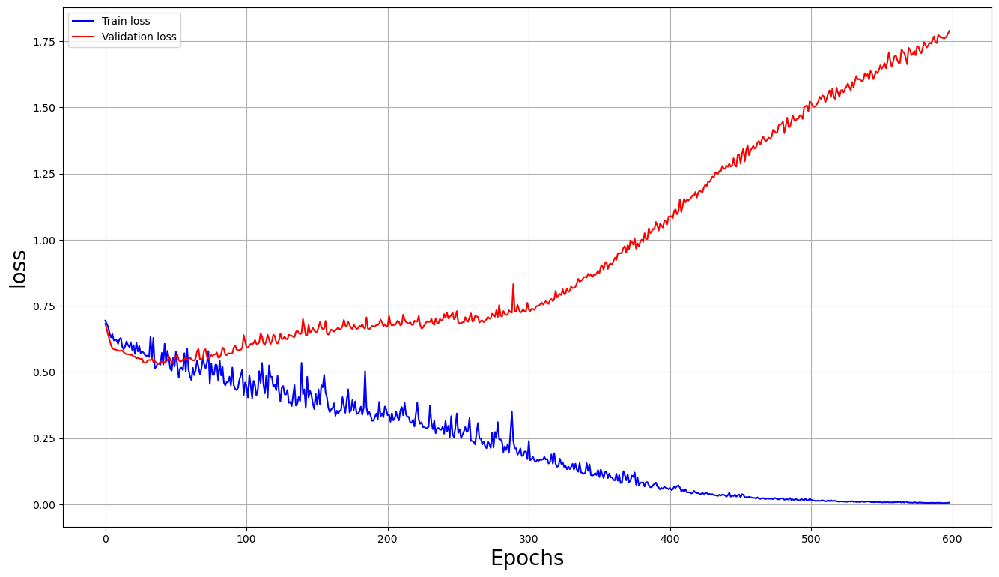

In [181]:
plt.figure(figsize=(16,9))
plt.plot(epoch_train_loss, c='b', label = 'Train loss')
plt.plot(epoch_val_loss, c = 'r', label = 'Validation loss')
plt.legend()
plt.grid()
plt.xlabel('Epochs', fontsize = 20)
plt.ylabel ('loss', fontsize = 20)